# Bird type classification using sequential model and ResNet 101 using Caltech


The purpose of this assignment is to gain experience building and training neural networks. You will learn:
- Design and train a fully-connected neural network
- Train an existing CNN architecture using fine-tuning
- Visualize the trained model


### Submission Details
Submit your Jupyter notebook .ipynb file using Brightspace. Do not include any other files or images as they will not be reviewed.
<p>
<strong>Make certain that you run all the cells in the notebook you submit</strong> or you will loose marks.
</p>
<ul>
<li>You can submit multiple times, but only the most recent submission will be saved</li>
<li>Do not wait until the last minute to submit in case you have an unexpected issue</li>
<li>Review the late policy in the syllabus</li>
<li><strong>You must submit your own work</strong> and abide by the University of Ottawa policy on plagiarism and fraud</li>
</ul>


### DO NOT submit any images from the dataset

## Part 0. Data Preparation

To complete the assignment you will download the Caltech Bird dataset and devise an appropriate training set split. <b>You are free to sample from the dataset to reduce the overal training samples depending on your access to compute.</b> Again, the overall accuracy is less important than your  observations and comparisons.

Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

The dataset contains annotations for various tasks. In this assignment you will use the categories for classification (species labels)

In this section:
<ul>
<li>Download the dataset as described above</li>
<li>Create your splits for your dataset (there is a split provided for the full dataset) </li>
<li>Visualize five samples of each class by plotting a grid using the matplotlib library.</li>
</ul>


0)A)

In [102]:
import matplotlib.pyplot as plt
import pandas as pd

import skimage.io
from skimage.transform import resize
from sklearn.preprocessing import OneHotEncoder
from sklearn.manifold import TSNE


import os

from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers
from tensorflow.keras.layers import InputLayer, BatchNormalization, Dropout, Flatten, Dense, Activation, MaxPool2D, Conv2D



from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout,InputLayer,BatchNormalizationV2,Activation

import PIL
import pathlib
import cv2

from tqdm import tqdm
from tqdm import trange
from tqdm.notebook import tqdm_notebook
import time

import numpy as np

import random

np.random.seed(45)
tf.random.set_seed(45)


In [2]:
#The data was uploaded to jupyter then the following directory was created
data_dir = './CUB_200_2011'
image_dir = os.path.join(data_dir,"images")

In [3]:
os.listdir(image_dir)

['001.Black_footed_Albatross',
 '002.Laysan_Albatross',
 '003.Sooty_Albatross',
 '004.Groove_billed_Ani',
 '005.Crested_Auklet',
 '006.Least_Auklet',
 '007.Parakeet_Auklet',
 '008.Rhinoceros_Auklet',
 '009.Brewer_Blackbird',
 '010.Red_winged_Blackbird',
 '011.Rusty_Blackbird',
 '012.Yellow_headed_Blackbird',
 '013.Bobolink',
 '014.Indigo_Bunting',
 '015.Lazuli_Bunting',
 '016.Painted_Bunting',
 '017.Cardinal',
 '018.Spotted_Catbird',
 '019.Gray_Catbird',
 '020.Yellow_breasted_Chat',
 '021.Eastern_Towhee',
 '022.Chuck_will_Widow',
 '023.Brandt_Cormorant',
 '024.Red_faced_Cormorant',
 '025.Pelagic_Cormorant',
 '026.Bronzed_Cowbird',
 '027.Shiny_Cowbird',
 '028.Brown_Creeper',
 '029.American_Crow',
 '030.Fish_Crow',
 '031.Black_billed_Cuckoo',
 '032.Mangrove_Cuckoo',
 '033.Yellow_billed_Cuckoo',
 '034.Gray_crowned_Rosy_Finch',
 '035.Purple_Finch',
 '036.Northern_Flicker',
 '037.Acadian_Flycatcher',
 '038.Great_Crested_Flycatcher',
 '039.Least_Flycatcher',
 '040.Olive_sided_Flycatcher',
 '

In [4]:
y=skimage.io.imread(fname="./CUB_200_2011/images/001.Black_footed_Albatross/Black_Footed_Albatross_0024_796089.jpg")

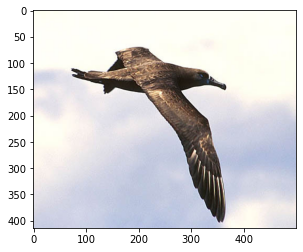

In [5]:
plt.imshow(y)

In [6]:
images_file = os.path.join(data_dir, "images.txt")
images = pd.read_csv(images_file,delim_whitespace=True,names=["image_ID","image_path"],index_col=["image_ID"])

class_labels_file = os.path.join(data_dir,"image_class_labels.txt")
class_labels = pd.read_csv(class_labels_file,delim_whitespace=True,names=["image_ID","class_ID"],index_col=["image_ID"])

bounding_boxes_file = os.path.join(data_dir,"bounding_boxes.txt")
bounding_boxes = pd.read_csv(bounding_boxes_file,delim_whitespace=True,names=["image_ID","x","y","width","height"],index_col=["image_ID"])


df = images.merge(class_labels,on=["image_ID"])
df = df.merge(bounding_boxes,on=["image_ID"])

In [7]:
df['image'] = df["image_path"].apply(lambda main: np.asarray(PIL.Image.open(os.path.join(image_dir,main))))

In [8]:
def crop(main):
    cropped_image = main["image"]
    x = int(main["x"])
    y = int(main["y"])
    height = int(main["height"])
    width = int(main["width"])
    return cropped_image[y:y+height, x:x+width]

In [9]:
df.head()

,image_path,class_ID,x,y,width,height,image
image_ID,,,,,,,
1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,60.0,27.0,325.0,304.0,"[[[6, 1, 0], [1, 0, 4], [0, 4, 7], [0, 7, 3], ..."
2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,139.0,30.0,153.0,264.0,"[[[0, 0, 0], [0, 0, 0], [4, 4, 4], [7, 7, 7], ..."
3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,14.0,112.0,388.0,186.0,"[[[113, 133, 160], [109, 130, 157], [116, 140,..."
4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,112.0,90.0,255.0,242.0,"[[[203, 203, 211], [203, 203, 211], [203, 203,..."
5,001.Black_footed_Albatross/Black_Footed_Albatr...,1,70.0,50.0,134.0,303.0,"[[[243, 245, 244], [244, 246, 245], [245, 247,..."


In [10]:
df["cropped_images"] = df.apply(crop,axis=1)


In [11]:
df.drop(columns = ["image","x","y","width","height"],axis=1,inplace=True)

In [12]:
df.iloc[0]

image_path        001.Black_footed_Albatross/Black_Footed_Albatr...
class_ID                                                          1
cropped_images    [[[4, 88, 160], [4, 86, 159], [1, 88, 157], [0...
Name: 1, dtype: object

In [13]:
len(images)

11788

In [14]:
# df.head()

0)B)

In [15]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df, df["class_ID"], test_size=0.2, stratify=df["class_ID"], random_state=45)
print(f"train size: {X_train.shape}")
print(f"test size: {X_test.shape}") 

train size: (9430, 3)
test size: (2358, 3)


In [16]:
# X_train.head()

In [17]:
import shutil
for i,row in X_train.iterrows():
    folder_name, image_name = row.image_path.split("/")
    os.makedirs(f"./Data/Train/{folder_name}/", exist_ok=True)
    shutil.copy(f"./CUB_200_2011/images/{row.image_path}", f"./Data/Train/{folder_name}/{image_name}")
    
for i,row in X_test.iterrows():
    folder_name, image_name = row.image_path.split("/")
    os.makedirs(f"./Data/Test/{folder_name}/", exist_ok=True)
    shutil.copy(f"./CUB_200_2011/images/{row.image_path}", f"./Data/Test/{folder_name}/{image_name}")

In [18]:
train_ds = keras.utils.image_dataset_from_directory(
    directory='./Data/Train/',
    batch_size=64,
    image_size=(32, 32))

test_ds = keras.utils.image_dataset_from_directory(
    directory='./Data/Test/',
    batch_size=64,
    image_size=(32, 32))

Found 9430 files belonging to 200 classes.
Found 2358 files belonging to 200 classes.


0)C)

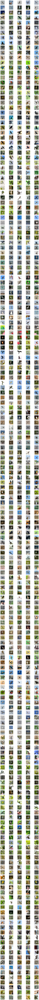

In [21]:
dictionary = dict()
folders = os.path.join(data_dir,"images")
#first five pictures
for folder in os.listdir(folders):
    dictionary[folder] =  os.listdir(os.path.join(folders,(folder)))[:5] 
dictionary_keys = list(dictionary.keys())
fig,att = plt.subplots(200, 5,figsize=(10,250));
for i in range(att.shape[0]):
    for j in range (att.shape[1]):
        img = PIL.Image.open(os.path.join
                             (folders,dictionary_keys[i],
                              dictionary[dictionary_keys[i]][j]))
        img = img.resize((128,128))
        img = np.asarray(img)
        att[i][j].imshow(img)
        att[i][j].set_axis_off()

## Part 1. Perceptron (3 Marks)
For this section you will implement a fully connected neural network (multi-layer perceptron). To do this you will need to perform the following steps:
- Resize the images to be no larger than 32x32.
- Use the sequential model API in keras to build your network using dense layers (consider performance impacts of fully connected layers)
- You must decide an appropriate number of neurons and layers.
- Print a summary of your model configuration. 


When your classifier is working:
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data
- Provide a brief discussion of your results 


 1)A),B),C),D)

In [22]:
model = keras.Sequential(
    [
        keras.Input(shape=(32,32,3)),
               
        Dense(256,kernel_initializer="he_uniform"),
        BatchNormalizationV2(),
        Activation("relu"),
        Dropout(0.3),
        
        Dense(128, kernel_initializer="he_uniform"),
        BatchNormalizationV2(),
        Activation("relu"),
        Dropout(0.2),
        
        Dense(64, kernel_initializer="he_uniform"),
        BatchNormalizationV2(),
        Activation("relu"),
        Dropout(0.2),
                
        Dense(32,kernel_initializer="he_uniform"),
        BatchNormalizationV2(),
        Activation("relu"),
        Dropout(0.1),

        layers.Flatten(),
        layers.Dropout(0.1),
        layers.Dense(200, activation="softmax"),
    ]
)

In [23]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32, 32, 256)       1024      
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 256)      1024      
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 32, 32, 256)       0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 256)       0         
                                                                 
 dense_1 (Dense)             (None, 32, 32, 128)       32896     
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                        

In [24]:
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
model.compile(loss=tf.losses.sparse_categorical_crossentropy, optimizer="adamax", metrics=["accuracy"])
sequential = model.fit(train_ds, batch_size=64, epochs=20, callbacks=[callback],validation_data=(test_ds),validation_split=0.1,verbose=1)

Epoch 1/20
148/148 [==============================] - 86s 573ms/step - loss: 6.5333 - accuracy: 0.0147 - val_loss: 4.9677 - val_accuracy: 0.0407
Epoch 2/20
148/148 [==============================] - 81s 546ms/step - loss: 4.6491 - accuracy: 0.0855 - val_loss: 5.0322 - val_accuracy: 0.0619
Epoch 3/20
148/148 [==============================] - 81s 544ms/step - loss: 3.6572 - accuracy: 0.2098 - val_loss: 5.2239 - val_accuracy: 0.0674
Epoch 4/20
148/148 [==============================] - 81s 544ms/step - loss: 2.7242 - accuracy: 0.4004 - val_loss: 5.4385 - val_accuracy: 0.0742
Epoch 5/20
148/148 [==============================] - 81s 543ms/step - loss: 1.9070 - accuracy: 0.5836 - val_loss: 5.5747 - val_accuracy: 0.0746
Epoch 6/20
148/148 [==============================] - 81s 544ms/step - loss: 1.2793 - accuracy: 0.7382 - val_loss: 5.6666 - val_accuracy: 0.0768
Epoch 7/20
148/148 [==============================] - 85s 573ms/step - loss: 0.8422 - accuracy: 0.8416 - val_loss: 5.8763 - val_ac

1)E)

In [25]:
def loss_plot (M):

    plt.plot(M.history['loss'])
    plt.plot(M.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss');
    plt.xlabel('epoch');
    plt.legend(['train', 'test']);
    
    

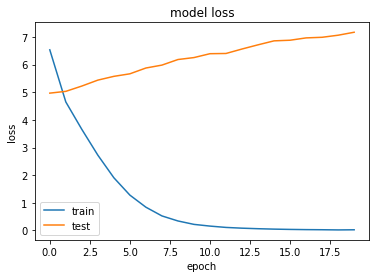

In [26]:
loss_plot(sequential)

1)F)

In [27]:
def accuracy_plot (M):
    plt.plot(M.history['accuracy'])
    plt.plot(M.history['val_accuracy'])
    plt.title('model accuracy')
    plt.ylabel('accuracy');
    plt.xlabel('epoch');
    plt.legend(['train', 'test']);

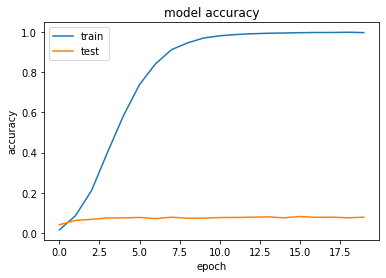

In [28]:
accuracy_plot(sequential)

1)G) Discussion:

There is clearly an overfitting issue since the model outputs around 99% accuracy in training and around 7% in testing. The model cannot extract image features and deals with images as pixels only, using convolutional neural network would make an outstanding change in accuracies between train and test which will fix the overfitting problem and can deal with more features such as shapes and edges in the pictures.

## Part 2. ResNet-101 (4 Marks)

For this section you will adapt the ResNet-101 network for the current task using tranfer learning and fine-tuning. You will implement the following in your process:
- You should choose a suitable image size.
- Choose a suitable labelling scheme.
- Use the pretrained ResNet-101 network available in Keras.
- Remove the top fully connected layers. Include your own FC layers that match our dataset.
- Choose some layers to "freeze" and the remaining layers you will fine-tune with the new dataset.

### Step 1
You will use the above steps to train a ResNet-101 model using the Bird dataset
- Use transfer learning to train your first model by removing the FC layers, but leaving the other layers intact.
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data

### Step 2
Now use the same steps as above, but this time unfreeze some convolutional layers and retrain the network. Again, plot your results.

### Step 3
Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.


### Step 1:

In [43]:
resnet = keras.applications.ResNet101V2(weights = "imagenet", classes = 200, include_top=False, input_shape = (64, 64, 3))
resnet.trainable = False

input_shape = keras.Input(shape= (64, 64, 3))
main = resnet(input_shape, training = False)
main = Flatten()(main)

main = Dense(256,kernel_initializer="he_uniform")(main)
main = BatchNormalizationV2()(main)
main = Activation("relu")(main)
main = Dropout(0.1)(main)

# main = Dense(128,kernel_initializer="he_uniform")(main)
# main = BatchNormalizationV2()(main)
# main = Activation("relu")(main)
# main = Dropout(0.5)(main)

# main = Dense(64,kernel_initializer="he_uniform")(main)
# main = BatchNormalizationV2()(main)
# main = Activation("relu")(main)
# main = Dropout(0.5)(main)

# main = Dense(32,kernel_initializer="he_uniform")(main)
# main = BatchNormalizationV2()(main)
# main = Activation("relu")(main)
# main = Dropout(0.2)(main)

output_l = Dense(200 ,activation='softmax')(main)
model_resnet = keras.Model(input_shape,output_l)
model_resnet.compile(loss="sparse_categorical_crossentropy",optimizer=tf.keras.optimizers.Adamax(learning_rate=0.001),metrics=['accuracy'])
model_resnet.summary()

# tf.losses.sparse_categorical_crossentropy

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 resnet101v2 (Functional)    (None, 2, 2, 2048)        42626560  
                                                                 
 flatten_4 (Flatten)         (None, 8192)              0         
                                                                 
 dense_14 (Dense)            (None, 256)               2097408   
                                                                 
 batch_normalization_9 (Batc  (None, 256)              1024      
 hNormalization)                                                 
                                                                 
 activation_10 (Activation)  (None, 256)               0         
                                                           

In [44]:
# model_resnet = freezed (classes = 200)


In [45]:
train_ds_resnet = keras.utils.image_dataset_from_directory(
    directory='./Data/Train/',
    batch_size=32,
    image_size=(64, 64))

test_ds_resnet = keras.utils.image_dataset_from_directory(
    directory='./Data/Test/',
    batch_size=32,
    image_size=(64, 64))

Found 9430 files belonging to 200 classes.
Found 2358 files belonging to 200 classes.


In [46]:
# tf.config.run_functions_eagerly(True)

history_freezed = model_resnet.fit(train_ds_resnet, batch_size=32, epochs=10, callbacks=[callback],validation_data=(test_ds_resnet),validation_split=0.1,verbose=1)


Epoch 1/10
295/295 [==============================] - 105s 331ms/step - loss: 5.2894 - accuracy: 0.0163 - val_loss: 5.2430 - val_accuracy: 0.0131
Epoch 2/10
295/295 [==============================] - 105s 355ms/step - loss: 4.9497 - accuracy: 0.0295 - val_loss: 5.2552 - val_accuracy: 0.0191
Epoch 3/10
295/295 [==============================] - 102s 346ms/step - loss: 4.7929 - accuracy: 0.0440 - val_loss: 5.1475 - val_accuracy: 0.0221
Epoch 4/10
295/295 [==============================] - 99s 336ms/step - loss: 4.6448 - accuracy: 0.0597 - val_loss: 5.1269 - val_accuracy: 0.0204
Epoch 5/10
295/295 [==============================] - 102s 347ms/step - loss: 4.4992 - accuracy: 0.0752 - val_loss: 5.0737 - val_accuracy: 0.0322
Epoch 6/10
295/295 [==============================] - 102s 346ms/step - loss: 4.3659 - accuracy: 0.0941 - val_loss: 5.1207 - val_accuracy: 0.0327
Epoch 7/10
295/295 [==============================] - 99s 336ms/step - loss: 4.2395 - accuracy: 0.1160 - val_loss: 5.0235 - v

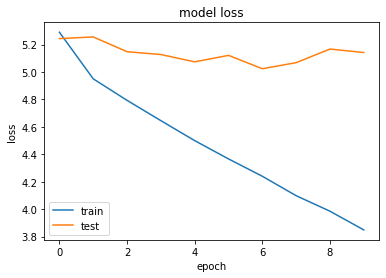

In [47]:
loss_plot(history_freezed)

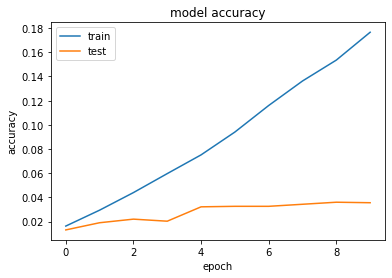

In [48]:
accuracy_plot(history_freezed)

### Step 2:

In [57]:
resnet_uf = keras.applications.ResNet101V2(weights = "imagenet", classes = 200, include_top=False, input_shape = (64, 64, 3))
retrained_layers_at = len(resnet_uf.layers) - 30
resnet_uf.trainable = True
for layer in resnet_uf.layers[:retrained_layers_at]:
    layer.trainable = False

input_shape_uf = keras.Input(shape=(64, 64, 3))
main = resnet_uf(input_shape_uf,training=False)

main = Flatten()(main)
main = Dense(256,kernel_initializer="he_uniform")(main)
main = BatchNormalizationV2()(main)
main = Activation("relu")(main)
main = Dropout(0.1)(main)

# main = Dense(64,kernel_initializer="he_uniform")(main)
# main = BatchNormalizationV2()(main)
# main = Activation("relu")(main)
# main = Dropout(0.2)(main)

# main = Dense(32,kernel_initializer="he_uniform")(main)
# main = BatchNormalizationV2()(main)
# main = Activation("relu")(main)
# main = Dropout(0.2)(main)



output_l_uf = Dense(200,activation='softmax')(main)
model_resnet_uf = keras.Model(input_shape_uf,output_l_uf)
model_resnet_uf.compile(loss="sparse_categorical_crossentropy",optimizer=tf.keras.optimizers.Adamax(learning_rate=0.001),metrics=['accuracy'])

model_resnet_uf.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(None, 64, 64, 3)]       0         
                                                                 
 resnet101v2 (Functional)    (None, 2, 2, 2048)        42626560  
                                                                 
 global_average_pooling2d_7   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 flatten_11 (Flatten)        (None, 2048)              0         
                                                                 
 dense_28 (Dense)            (None, 128)               262272    
                                                                 
 batch_normalization_16 (Bat  (None, 128)              512       
 chNormalization)                                         

In [58]:
history_unfreezed = model_resnet_uf.fit(train_ds_resnet, batch_size=64, epochs=10, callbacks=[callback],validation_data=(test_ds_resnet),validation_split=0.1,verbose=1)

Epoch 1/10
295/295 [==============================] - 259s 850ms/step - loss: 5.4215 - accuracy: 0.0058 - val_loss: 5.4314 - val_accuracy: 0.0068
Epoch 2/10
295/295 [==============================] - 242s 821ms/step - loss: 5.2415 - accuracy: 0.0090 - val_loss: 5.3500 - val_accuracy: 0.0042
Epoch 3/10
295/295 [==============================] - 240s 812ms/step - loss: 5.1653 - accuracy: 0.0075 - val_loss: 5.1197 - val_accuracy: 0.0076
Epoch 4/10
295/295 [==============================] - 241s 817ms/step - loss: 5.1179 - accuracy: 0.0113 - val_loss: 5.2965 - val_accuracy: 0.0098
Epoch 5/10
295/295 [==============================] - 242s 819ms/step - loss: 5.0549 - accuracy: 0.0128 - val_loss: 5.5756 - val_accuracy: 0.0093
Epoch 6/10
295/295 [==============================] - 235s 795ms/step - loss: 5.0097 - accuracy: 0.0190 - val_loss: 5.7345 - val_accuracy: 0.0068
Epoch 7/10
295/295 [==============================] - 229s 774ms/step - loss: 4.9625 - accuracy: 0.0172 - val_loss: 5.4762 -

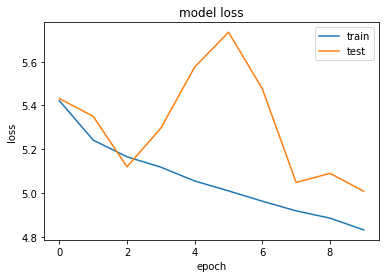

In [59]:
loss_plot(history_unfreezed)

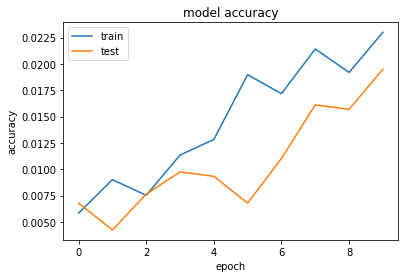

In [60]:
accuracy_plot(history_unfreezed)

### Discussion:

Theoritically, during back propagation, the unfreezed model retrieves the feedback and updates the weights to overcome the untrainable model. There is an underfitting issue in both models due to lack of input data, nevertheless, the processing power to handle such a big number of parameters. 

## Part 3. Visualization (3 Marks)

For this section you will visualize the filters learned byyour ResNet-101 network and use t-SNE to observe clusters that were learned by your model.
- Make sure to provide the graphic results for your visualizations
- Provide an interpretation of the results


Visualize the activation maps produced by your network and discuss the results using an image from the test test and another image of your choice.

In [71]:
filters,_ = model_resnet_uf.layers[1].layers[2].get_weights()
print(layer.name, filters.shape)

conv5_block1_2_pad (7, 7, 3, 64)


In [70]:
model_resnet_uf.layers[1].summary()

Model: "resnet101v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_22 (InputLayer)          [(None, 64, 64, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 70, 70, 3)    0           ['input_22[0][0]']               
                                                                                                  
 conv1_conv (Conv2D)            (None, 32, 32, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 34, 34, 64)   0           ['conv1_conv[0][0]']             
                                                                                        

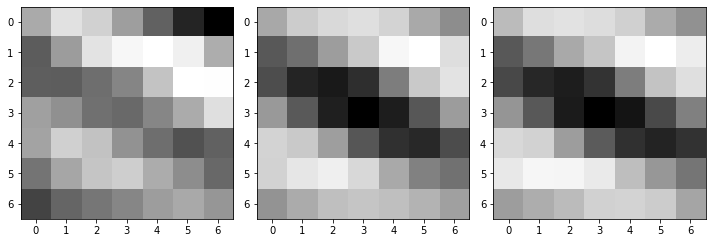

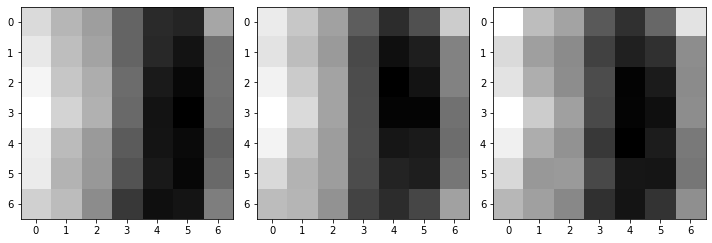

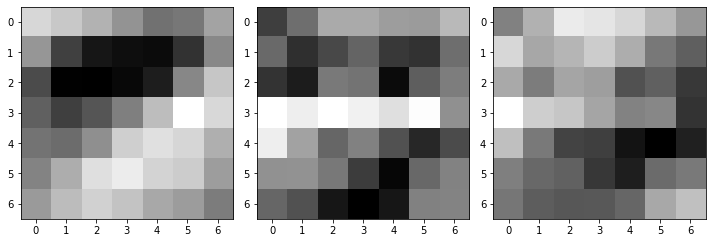

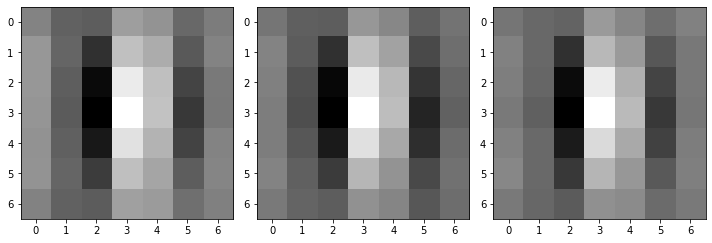

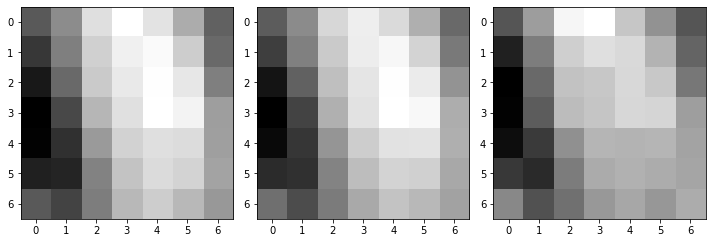

...

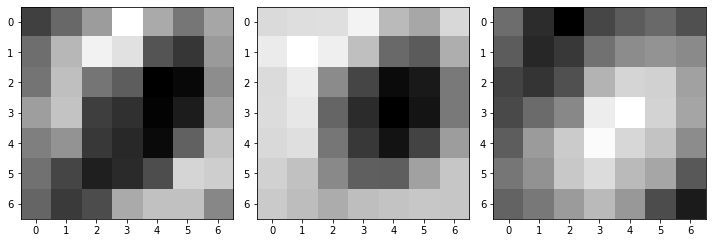

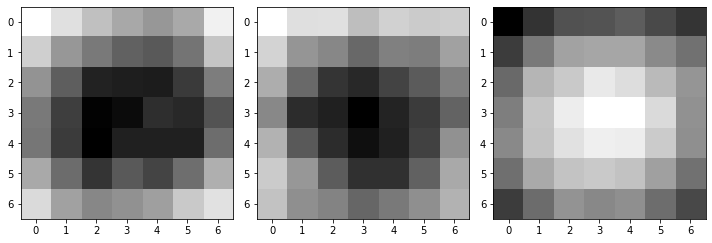

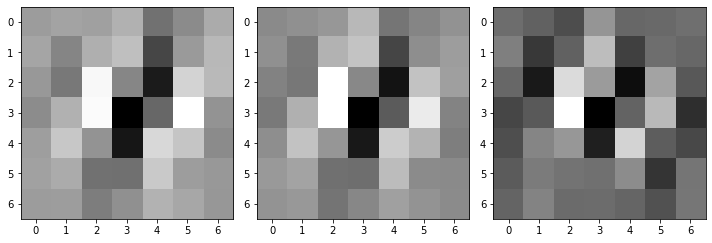

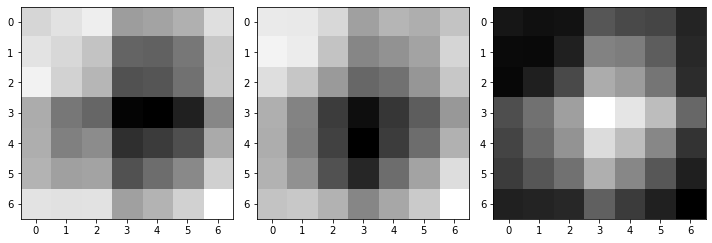

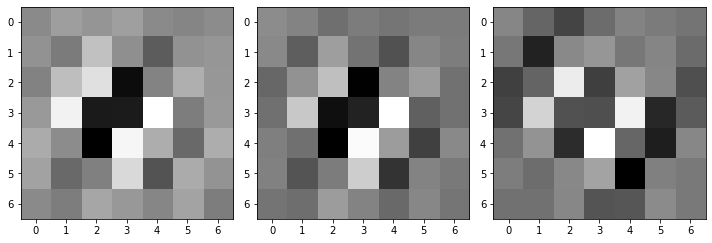

In [84]:
min_filter = filters.min()
max_filter = filters.max()
filters = (filters - min_filter) / (max_filter - min_filter)

for i in range(filters.shape[3]):
    filters_R = filters[:,:,:, i]
    fig,axes = plt.subplots(1, 3, figsize=(10,10))
    for j in range(3):
        axes[j].imshow(filters_R[:,:,j],cmap='gray')
    plt.tight_layout()
    plt.show()

In [100]:
out = model_resnet_uf.get_layer("dropout_17").output
resnet_featues = keras.Model(model_resnet_uf.input, out)
feature =resnet_featues.predict(test_ds_resnet)

74/74 [==============================] - 79s 263ms/step


In [103]:
tsne = TSNE(n_components=2, random_state=100)
tsne = tsne.fit_transform(feature) 

tsne_x, tsne_y = tsne[:,0], tsne[:,1]
tsne_x = (tsne_x-np.min(tsne_x)) / (np.max(tsne_x) - np.min(tsne_x))
tsne_y = (tsne_y-np.min(tsne_y)) / (np.max(tsne_y) - np.min(tsne_y))

C:\Users\Legion\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Legion\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


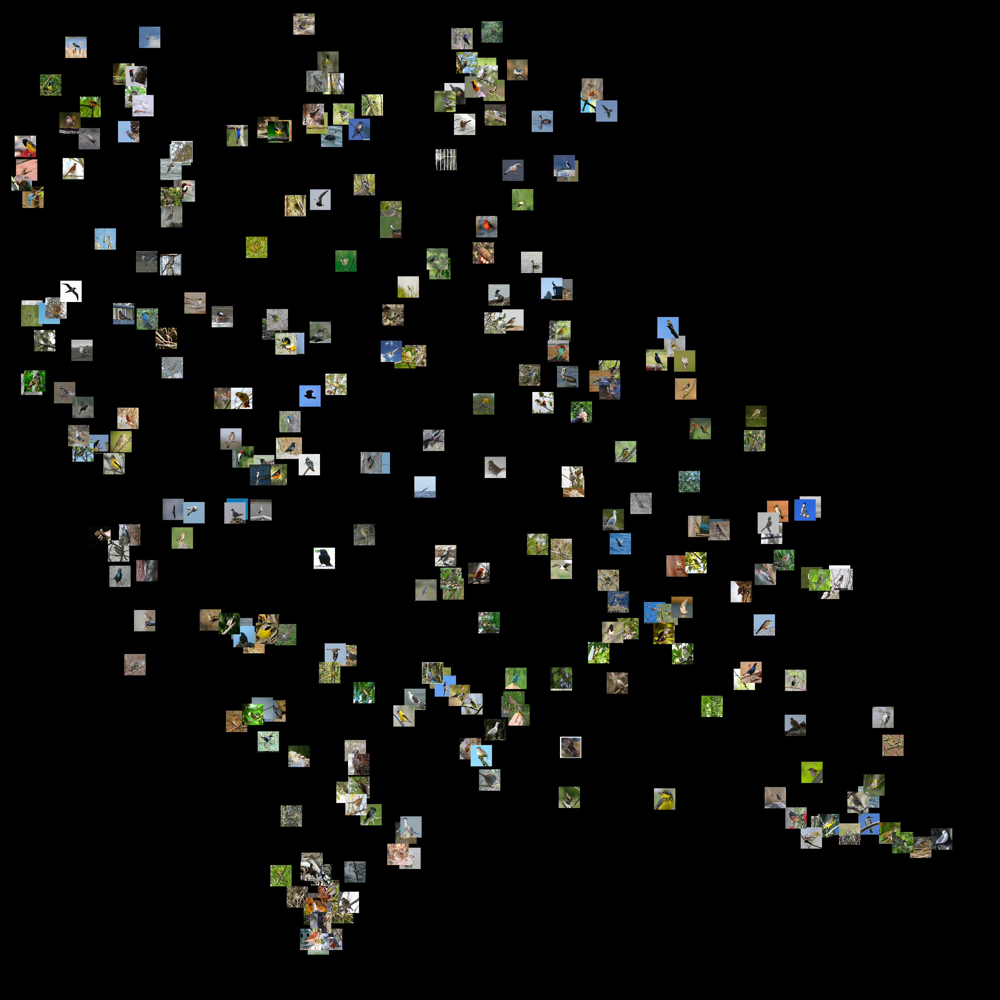

In [116]:


tsne_plot = PIL.Image.new('RGB', (3000, 3000))
for i, j in enumerate(train_ds_resnet):
    for im in j[0]:
        unit = PIL.Image.fromarray(np.uint8(im))
        shape = max(1, unit.width / 200, unit.height / 200)
        unit = unit.resize((int(unit.width / shape), int(unit.width / shape)), PIL.Image.ANTIALIAS)
        tsne_plot.paste(unit, (int((3000-200) * tsne_x[i]), int((3000-200) * tsne_y[i])))
tsne_plot

### Discussion:

As show in the T-SNE plot, the model was able to classify few classes correctly because of the high computational power needed and lack of data like in the previous discussion. There is some overlapping between the classes because of similarities in images features in different types of birds. the 17th layer of dropout was shown using 3 filter channels for the 3 dimentional set of images (RGB)